In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
import plotly.colors as pc

In [50]:
df=pd.read_csv(r"E:\capstone_projects\fashion_data.csv")

In [51]:
df.head()

,product_id,product_type,product_name,product_description,product_keywords,product_gender_target,product_category,product_season,product_condition,product_like_count,...,warehouse_name,seller_id,seller_username,usually_ships_within,seller_country,seller_products_sold,seller_num_products_listed,seller_community_rank,seller_num_followers,seller_pass_rate
0,43247626,Wool mini skirt,Wool mini skirt Miu Miu Grey size S Internatio...,Miu Miu – Pleated mini skirt Size: 36 (S) Wai...,Miu Miu Wool Skirts,Women,Women Clothing,Autumn / Winter,Never worn,34.0,...,Tourcoing,25775970,vitalii25775970,NaN,Germany,3.0,14.0,0.0,13.0,0.0
1,43247441,Jacket,Jacket Barbara Bui Navy size 42 FR in Cotton,For selling nice women's suit Barbara Bui size...,Barbara Bui Cotton Jackets,Women,Women Clothing,All seasons,Very good condition,1.0,...,Tourcoing,13698770,olivia13698770,NaN,Belgium,0.0,0.0,0.0,8.0,0.0
2,43246517,Wool coat,Wool coat Comme Des Garcons White size S Inter...,Magnificent boiled wool coat. I bought it in t...,Comme Des Garcons Wool Coats,Women,Women Clothing,Autumn / Winter,Very good condition,2.0,...,Tourcoing,6042365,cecilia6042365,1-2 days,Spain,58.0,69.0,0.0,62.0,96.0
3,43246507,Mini skirt,Mini skirt MSGM Black size 38 IT in Polyester,MSGM Skirt Black Printed Raw-Edge & Embroidere...,MSGM Polyester Skirts,Women,Women Clothing,All seasons,Very good condition,0.0,...,Brooklyn,13172949,gretchen13172949,1-2 days,United States,63.0,274.0,126346.0,131.0,96.0
4,43246417,Vegan leather trousers,Vegan leather trousers LVIR Black size 36 FR i...,LVIR black grained faux leather trousers size ...,LVIR Vegan leather Trousers,Women,Women Clothing,All seasons,Very good condition,1.0,...,Crawley,2578605,crunchykat,3-5 days,United Kingdom,19.0,14.0,102821.0,40.0,89.0


In [52]:
df1 = df.copy()
df1.columns

Index(['product_id', 'product_type', 'product_name', 'product_description',
       'product_keywords', 'product_gender_target', 'product_category',
       'product_season', 'product_condition', 'product_like_count', 'sold',
       'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_id',
       'brand_name', 'brand_url', 'product_material', 'product_color',
       'price_usd', 'seller_price', 'seller_earning', 'seller_badge',
       'has_cross_border_fees', 'buyers_fees', 'warehouse_name', 'seller_id',
       'seller_username', 'usually_ships_within', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_community_rank', 'seller_num_followers', 'seller_pass_rate'],
      dtype='object')

In [53]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900514 entries, 0 to 900513
Data columns (total 36 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   product_id                  900514 non-null  int64  
 1   product_type                900514 non-null  object 
 2   product_name                900514 non-null  object 
 3   product_description         900507 non-null  object 
 4   product_keywords            899331 non-null  object 
 5   product_gender_target       900514 non-null  object 
 6   product_category            899331 non-null  object 
 7   product_season              900512 non-null  object 
 8   product_condition           900514 non-null  object 
 9   product_like_count          900514 non-null  float64
 10  sold                        900514 non-null  bool   
 11  reserved                    900514 non-null  bool   
 12  available                   900514 non-null  bool   
 13  in_stock      

In [54]:
(df1.isna().mean() * 100).sum() #Percentage of data Removed

20.50850958452617

In [55]:
df1.isna().mean() * 100

product_id                     0.000000
product_type                   0.000000
product_name                   0.000000
product_description            0.000777
product_keywords               0.131369
product_gender_target          0.000000
product_category               0.131369
product_season                 0.000222
product_condition              0.000000
product_like_count             0.000000
sold                           0.000000
reserved                       0.000000
available                      0.000000
in_stock                       0.000000
should_be_gone                 0.000000
brand_id                       0.000000
brand_name                     0.000000
brand_url                      0.000000
product_material               0.000444
product_color                  0.000111
price_usd                      0.000000
seller_price                   0.000000
seller_earning                 0.000000
seller_badge                   0.000000
has_cross_border_fees          1.525351


In [56]:
# Filling missing values with the mode for categorical columns
df1['usually_ships_within'] = df1['usually_ships_within'].fillna(df1['usually_ships_within'].mode()[0])
df1['product_category'] = df1['product_category'].fillna(df1['product_category'].mode()[0])
df1['product_keywords'] = df1['product_keywords'].fillna(df1['product_keywords'].mode()[0])

# Filling missing values with the median for numerical columns
df1['buyers_fees'] = df1['buyers_fees'].fillna(df1['buyers_fees'].median())

In [57]:
df1[['has_cross_border_fees']].value_counts()

has_cross_border_fees
True                     886778
Name: count, dtype: int64

In [58]:
df1['has_cross_border_fees'].fillna(False, inplace=True)

In [59]:
print(f'Percentage of missing values: {(df1.isna().mean() * 100).sum().round(4)}')

Percentage of missing values: 0.0059


In [60]:
df1.dropna(inplace=True)
print(f'Percentage of missing values: {(df1.isna().mean() * 100).sum()}')

Percentage of missing values: 0.0


In [61]:
df1.shape

(900461, 36)

In [62]:
print(f'Amount of duplicates: {df1.duplicated().sum()}')


Amount of duplicates: 0


EDA

In [63]:
gender_count = df1['product_gender_target'].value_counts()

fig = go.Figure(data=[go.Pie(labels=gender_count.index, values=gender_count.values, 
                             hoverinfo='label+value', textinfo='percent',
                             textfont_size=20, marker=dict( 
                             line=dict(color='#000000', width=2)))])

fig.update_layout(title_text='Gender Distribution', title_font_size=24)
fig.show()

In [64]:
top_10_brands_by_listings = df1['brand_name'].value_counts().head(10).reset_index()
top_10_brands_by_listings.columns = ['brand_name', 'count']

fig = px.bar(top_10_brands_by_listings, x='count', y='brand_name', 
             title='Top Brands by Number of Listings', 
             labels={'count': 'Number of Listings', 'brand_name': 'Brand Name'},
             color_discrete_sequence=['#ff5a28'],
             orientation='h')

fig.update_layout(
    title_font_size=24, 
    xaxis_title='Number of Listings', 
    yaxis_title='Brand Name',
    yaxis=dict(categoryorder='total ascending') 
)
fig.show()

In [65]:
likes_per_brand = df1.groupby('brand_name')['product_like_count'].sum().reset_index()
likes_per_brand = likes_per_brand.sort_values(by='product_like_count', ascending=False)
top_10_brands_by_likes = likes_per_brand.head(10)
fig = px.bar(top_10_brands_by_likes, x='product_like_count', y='brand_name', 
             title='Top Brands by Likes', 
             labels={'product_like_count': 'Total Likes', 'brand_name': 'Brand Name'},
             color_discrete_sequence=['#ff5a28'],
             orientation='h')

fig.update_layout(title_font_size=24, xaxis_title='Total Likes', yaxis_title='Brand Name', yaxis=dict(categoryorder='total ascending'))
fig.show()

In [66]:
gucci = df1[(df1['brand_name'] == 'Gucci')]
gucci_likes = gucci['product_like_count'].sum()
print(f'Average Likes per Product: {gucci_likes/len(gucci)}')

Average Likes per Product: 10.440816426063208


In [67]:
chanel = df1[(df1['brand_name'] == 'Chanel')]
chanel_likes = chanel['product_like_count'].sum()
print(f'Average Likes per Product: {chanel_likes/len(chanel)}')

Average Likes per Product: 15.08716513394642


In [68]:
brand_stats = df.groupby('brand_name').agg(
    total_likes=('product_like_count', 'sum'),
    listing_count=('brand_name', 'count')
).reset_index()

# Calculate average likes per product
brand_stats['avg_likes_per_product'] = brand_stats['total_likes'] / brand_stats['listing_count']

sorted_by_listing_count = brand_stats.sort_values(by='listing_count', ascending=False).head(10)
by_avg = sorted_by_listing_count.sort_values(by='avg_likes_per_product', ascending=False)

fig = px.bar(by_avg, x='avg_likes_per_product', y='brand_name', 
             title='Top Brands by Average Number of Likes per Post', 
             labels={'avg_likes_per_product': 'Average Likes', 'brand_name': 'Brand Name'},
             color_discrete_sequence=['#ff5a28'],
             orientation='h')

fig.update_layout(title_font_size=24, xaxis_title='Average Likes', yaxis_title='Brand Name', yaxis=dict(categoryorder='total ascending'))
fig.show()

In [69]:
country_count = df1['seller_country'].value_counts().head(10).reset_index()
country_count.columns = ['Country', 'Count']

fig = px.bar(country_count, x='Country', y='Count', orientation='v', 
             title='Top 10 Countries by Seller Count', 
             labels={'Count': 'Count', 'Country': 'Country'},
             color_discrete_sequence=['#ff5a28'])

fig.update_layout(title_font_size=24, xaxis_title='Country', yaxis_title='Count')
fig.show()

In [70]:
top_products = df1['product_type'].value_counts().head(20).reset_index()
top_products.columns = ['Product', 'Count']

fig = px.bar(top_products, x='Count', y='Product', orientation='h', 
             title='Top 20 Products', 
             labels={'Count': 'Count', 'Product': 'Product'},
             color_discrete_sequence=['#ff5a28'])

fig.update_layout(title_font_size=24, xaxis_title='Count', yaxis_title='Product', yaxis={'categoryorder':'total ascending'})
fig.show()

In [71]:

product_category_count = df1['product_category'].value_counts().reset_index()
product_category_count.columns = ['Product', 'Count']

fig = px.bar(product_category_count, x='Count', y='Product', orientation='h', 
             title='Product Category Distribution', 
             labels={'Count': 'Count', 'Product': 'Product'},
             color_discrete_sequence=['#ff5a28'])

fig.update_layout(title_font_size=24, xaxis_title='Count', yaxis_title='Product', yaxis={'categoryorder':'total ascending'})
fig.show()

In [72]:
top_materials = df1['product_material'].value_counts().head(20).reset_index()
top_materials.columns = ['Material', 'Count']

fig = px.bar(top_materials, x='Count', y='Material', orientation='h', 
             title='Top Materials', 
             labels={'Count': 'Count', 'Material': 'Material'},
             color_discrete_sequence=['#ff5a28'])
fig.update_layout(title_font_size=24, xaxis_title='Count', yaxis_title='Material', yaxis={'categoryorder':'total ascending'})
fig.show()

In [73]:
top_colors = df1['product_color'].value_counts().head(20).reset_index()
top_colors.columns = ['Color', 'Count']

fig = px.bar(top_colors, x='Color', y='Count', 
             title='Top 20 Product Colors', 
             labels={'Count': 'Number of Products', 'Color': 'Product Color'},
             color_discrete_sequence=['#ff5a28'])

fig.update_layout(title_font_size=24, xaxis_title='Product Color', yaxis_title='Count')
fig.show()

In [74]:
categories_colors = df1.groupby('product_category')['product_color'].value_counts().reset_index(name='Count')
mens_clothing = categories_colors[(categories_colors['product_category'] == 'Men Clothing')]
womens_clothing = categories_colors[(categories_colors['product_category'] == 'Women Clothing')]

mens_clothing_top20 = mens_clothing.sort_values(by='Count', ascending=False).head(20)
womens_clothing_top20 = womens_clothing.sort_values(by='Count', ascending=False).head(20)

trace1 = go.Bar(
    x=mens_clothing_top20['product_color'],
    y=mens_clothing_top20['Count'],
    name='Men Clothing',
    marker=dict(color='#2875ff')  
)

trace2 = go.Bar(
    x=womens_clothing_top20['product_color'],
    y=womens_clothing_top20['Count'],
    name='Women Clothing',
    marker=dict(color='#ff5a28') 
)
data = [trace1, trace2]

layout = go.Layout(
    title='Top 20 Colors in Men\'s and Women\'s Clothing',
    xaxis=dict(title='Color'),
    yaxis=dict(title='Count'),
    barmode='group'
)
fig = go.Figure(data=data, layout=layout)
fig.show()

In [75]:
condition_counts = df1['product_condition'].value_counts().reset_index()
condition_counts.columns = ['Product Condition', 'Count']

fig = px.bar(condition_counts, x='Product Condition', y='Count', 
             title='Product Condition Distribution', 
             labels={'Count': 'Number of Products', 'Product Condition': 'Condition'},
             color_discrete_sequence=['#ff5a28'])

fig.update_layout(title_font_size=24, xaxis_title='Product Condition', yaxis_title='Count')
fig.show()

In [76]:
seasons_count = df1['product_season'].value_counts()

fig = go.Figure(data=[go.Pie(labels=seasons_count.index, values=seasons_count.values, 
                             hoverinfo='label+value', textinfo='percent',
                             textfont_size=20, marker=dict(line=dict(color='#000000', width=2)))])

fig.update_layout(title_text='Season Distribution', title_font_size=24)
fig.show()

In [77]:
brand_price = df1.groupby(['brand_name', 'product_type'])['price_usd'].mean().reset_index()
brand_price = brand_price.sort_values(by='price_usd', ascending=False)
top_10_brand_product_prices = brand_price.head(10)

fig = px.bar(top_10_brand_product_prices, x='brand_name', y='price_usd',
             color='product_type',
             title='Top 10 Brands by Average Product Price',
             labels={'brand_name': 'Brand', 'price_usd': 'Average Price (USD)', 'product_type': 'Product Type'},
             color_discrete_sequence=['#ff5a28'])

fig.update_layout(title_font_size=24, xaxis_title='Brand', yaxis_title='Average Price (USD)')
fig.show()


In [78]:
category_price = df1.groupby(['product_category'])['price_usd'].median().reset_index()

fig = px.bar(category_price, x='product_category', y='price_usd',
             title='Median Prices for Each Category',
             labels={'product_category': 'Product Category', 'price_usd': 'Median Price (USD)'},
             color_discrete_sequence=['#ff5a28'])

fig.update_layout(title_font_size=24, xaxis_title='Product Category', yaxis_title='Median Price (USD)', 
                  xaxis={'categoryorder':'total descending'}, 
                  template='plotly_white')
fig.show()

In [79]:
fig = px.histogram(df1, x='price_usd', nbins=50, title='Distribution of Prices (Log Scale)', color_discrete_sequence=['#ff5a28'])
fig.update_layout(title_font_size=24, xaxis_title='Price in USD', yaxis_title='Frequency', yaxis_type='log')
fig.show()

In [80]:
numerical_columns = df1.select_dtypes(include=np.number)
numerical_columns = numerical_columns[['product_like_count','price_usd', 'seller_price', 'seller_earning', 'buyers_fees', 'seller_products_sold', 'seller_num_products_listed', 'seller_community_rank', 'seller_num_followers', 'seller_pass_rate']]

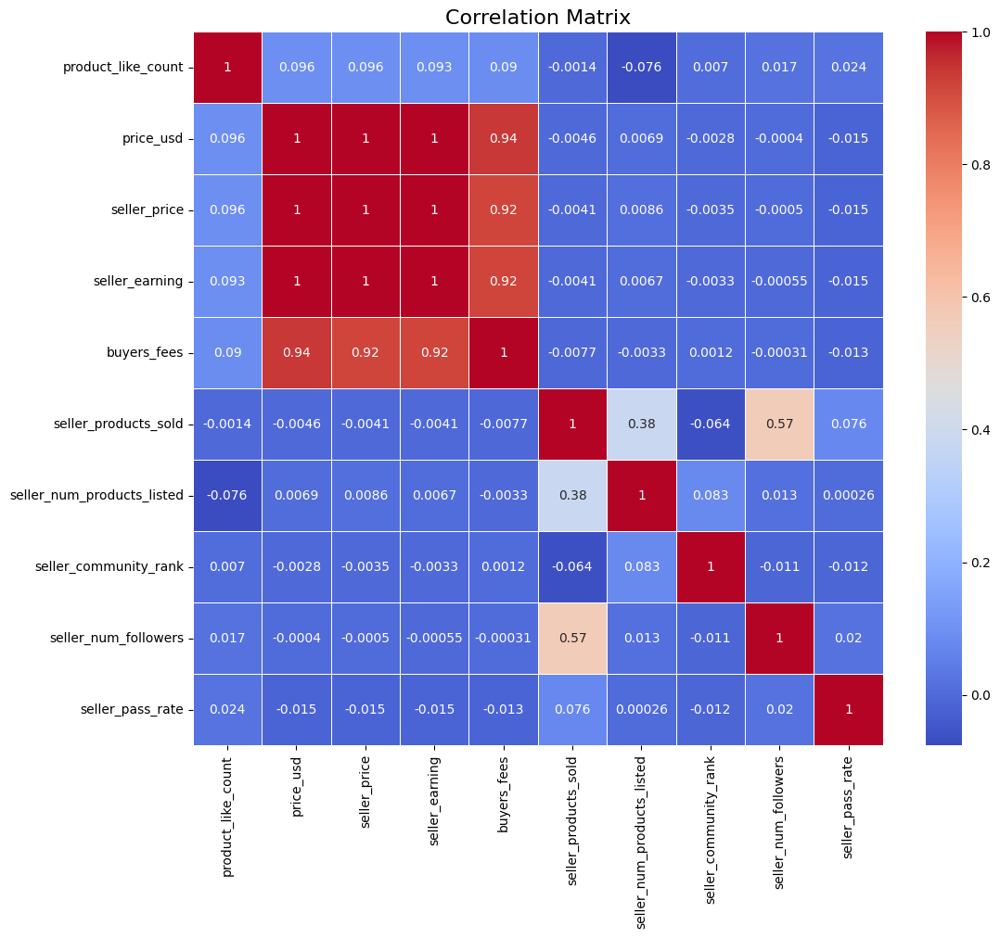

In [81]:
correlation_matrix = numerical_columns.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix', fontsize=16)
plt.show()

In [82]:


import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler

# Select your numerical columns
numerical_columns = df1[['product_like_count', 'price_usd', 'seller_price', 'seller_earning', 
                         'buyers_fees', 'seller_products_sold', 'seller_num_products_listed', 
                         'seller_community_rank', 'seller_num_followers', 'seller_pass_rate']]

# Standardize the data (VIF is sensitive to the scale of variables)
scaler = StandardScaler()
scaled_numerical_columns = scaler.fit_transform(numerical_columns)

# Create a DataFrame for VIF calculation
vif_data = pd.DataFrame()
vif_data["feature"] = numerical_columns.columns
vif_data["VIF"] = [variance_inflation_factor(scaled_numerical_columns, i) for i in range(scaled_numerical_columns.shape[1])]

# Display VIF values
print(vif_data)


                      feature           VIF
0          product_like_count      1.025218
1                   price_usd  69809.419396
2                seller_price  51850.713392
3              seller_earning    504.146107
4                 buyers_fees   1671.673801
5        seller_products_sold      1.901391
6  seller_num_products_listed      1.299285
7       seller_community_rank      1.022932
8        seller_num_followers      1.593679
9            seller_pass_rate      1.009018


In [83]:
# REMOVING price_usd, seller_price, seller_earning

In [84]:
df1# Dropping specific columns
df1 = df1.drop([ 'seller_price', 'seller_earning'], axis=1)


In [85]:
df1.shape

(900461, 34)

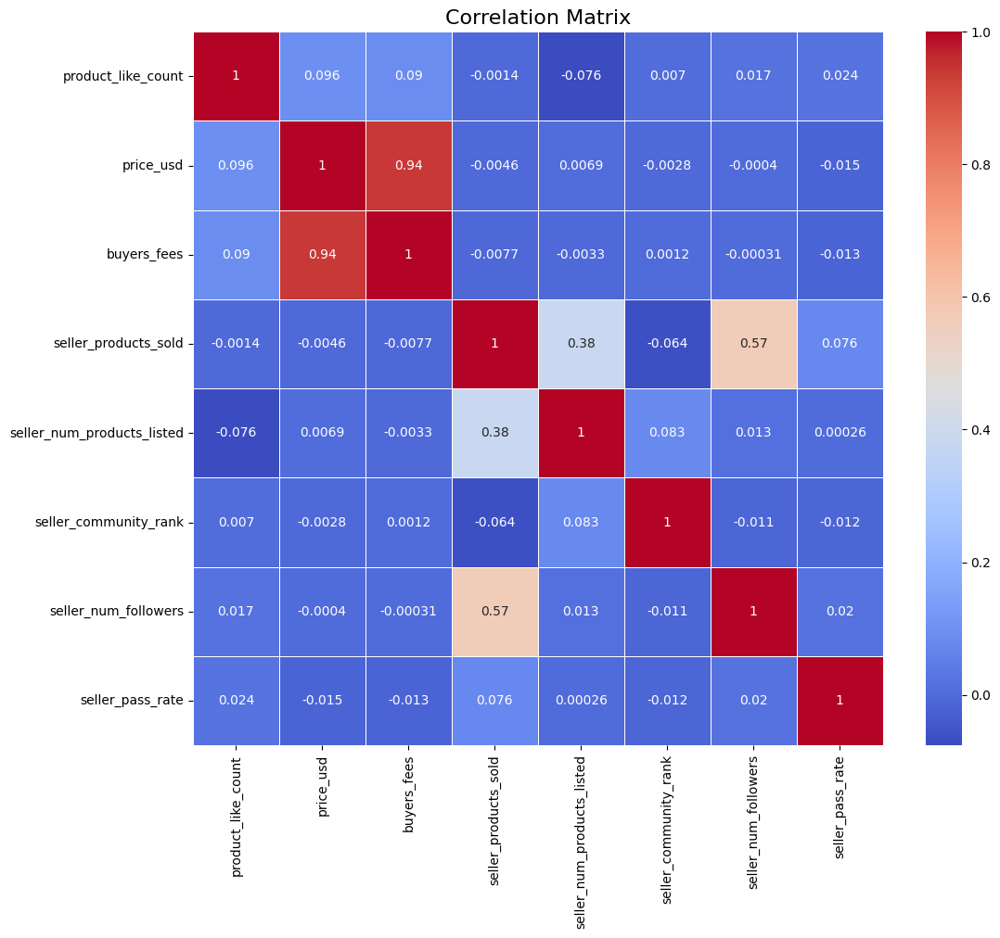

In [86]:
numerical_columns = numerical_columns[['product_like_count','price_usd',  'buyers_fees', 'seller_products_sold', 'seller_num_products_listed', 'seller_community_rank', 'seller_num_followers', 'seller_pass_rate']]
correlation_matrix = numerical_columns.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix', fontsize=16)
plt.show()

In [87]:
df1.columns

Index(['product_id', 'product_type', 'product_name', 'product_description',
       'product_keywords', 'product_gender_target', 'product_category',
       'product_season', 'product_condition', 'product_like_count', 'sold',
       'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_id',
       'brand_name', 'brand_url', 'product_material', 'product_color',
       'price_usd', 'seller_badge', 'has_cross_border_fees', 'buyers_fees',
       'warehouse_name', 'seller_id', 'seller_username',
       'usually_ships_within', 'seller_country', 'seller_products_sold',
       'seller_num_products_listed', 'seller_community_rank',
       'seller_num_followers', 'seller_pass_rate'],
      dtype='object')

In [88]:
df1.head()

,product_id,product_type,product_name,product_description,product_keywords,product_gender_target,product_category,product_season,product_condition,product_like_count,...,warehouse_name,seller_id,seller_username,usually_ships_within,seller_country,seller_products_sold,seller_num_products_listed,seller_community_rank,seller_num_followers,seller_pass_rate
0,43247626,Wool mini skirt,Wool mini skirt Miu Miu Grey size S Internatio...,Miu Miu – Pleated mini skirt Size: 36 (S) Wai...,Miu Miu Wool Skirts,Women,Women Clothing,Autumn / Winter,Never worn,34.0,...,Tourcoing,25775970,vitalii25775970,1-2 days,Germany,3.0,14.0,0.0,13.0,0.0
1,43247441,Jacket,Jacket Barbara Bui Navy size 42 FR in Cotton,For selling nice women's suit Barbara Bui size...,Barbara Bui Cotton Jackets,Women,Women Clothing,All seasons,Very good condition,1.0,...,Tourcoing,13698770,olivia13698770,1-2 days,Belgium,0.0,0.0,0.0,8.0,0.0
2,43246517,Wool coat,Wool coat Comme Des Garcons White size S Inter...,Magnificent boiled wool coat. I bought it in t...,Comme Des Garcons Wool Coats,Women,Women Clothing,Autumn / Winter,Very good condition,2.0,...,Tourcoing,6042365,cecilia6042365,1-2 days,Spain,58.0,69.0,0.0,62.0,96.0
3,43246507,Mini skirt,Mini skirt MSGM Black size 38 IT in Polyester,MSGM Skirt Black Printed Raw-Edge & Embroidere...,MSGM Polyester Skirts,Women,Women Clothing,All seasons,Very good condition,0.0,...,Brooklyn,13172949,gretchen13172949,1-2 days,United States,63.0,274.0,126346.0,131.0,96.0
4,43246417,Vegan leather trousers,Vegan leather trousers LVIR Black size 36 FR i...,LVIR black grained faux leather trousers size ...,LVIR Vegan leather Trousers,Women,Women Clothing,All seasons,Very good condition,1.0,...,Crawley,2578605,crunchykat,3-5 days,United Kingdom,19.0,14.0,102821.0,40.0,89.0


In [89]:
df1# Dropping specific columns
df1 = df1.drop([ 'product_id', 'product_name',	'product_description','product_keywords','brand_id','brand_url','warehouse_name','seller_id', 'seller_username','usually_ships_within'], axis=1)


In [90]:
df1.columns

Index(['product_type', 'product_gender_target', 'product_category',
       'product_season', 'product_condition', 'product_like_count', 'sold',
       'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_name',
       'product_material', 'product_color', 'price_usd', 'seller_badge',
       'has_cross_border_fees', 'buyers_fees', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_community_rank', 'seller_num_followers', 'seller_pass_rate'],
      dtype='object')

In [91]:
df1["product_type"].unique()

array(['Wool mini skirt', 'Jacket', 'Wool coat', ...,
       'Velvet western boots', 'Marmont cloth cowboy boots',
       'Kitty cloth heels'], dtype=object)

In [92]:
# from scipy import stats

# # Group prices by product type
# groups = df.groupby('product_type')['price_usd'].apply(list)
# anova_results = stats.f_oneway(*groups)
# print(anova_results)


In [93]:
# from scipy import stats

# # Group prices by product type
# groups = df.groupby('brand_name')['price_usd'].apply(list)
# anova_results = stats.f_oneway(*groups)
# print(anova_results)


In [94]:
frequency_encoding = df1['product_type'].value_counts().to_dict()
df1['product_type_encoded'] = df1['product_type'].map(frequency_encoding)
frequency_encoding = df1['brand_name'].value_counts().to_dict()
df1['brand_name_encoded'] = df1['brand_name'].map(frequency_encoding)


In [95]:
df1['brand_name_encoded'].nunique()

612

In [96]:
# Assuming 'product_gender_target' has values 'Male' and 'Female'
df1['product_gender_target_binary'] = df1['product_gender_target'].apply(lambda x: 1 if x == 'Men' else 0)


In [97]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df1['product_category_encoded'] = le.fit_transform(df1['product_category'])


In [129]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df1['product_material_encoded'] = le.fit_transform(df1['product_material'])


In [133]:
df1['product_material'].unique()

array(['Wool', 'Cotton', 'Polyester', 'Vegan leather',
       'Cotton - elasthane', 'Silk', 'Synthetic', 'Lycra', 'Viscose',
       'Denim - Jeans', 'Linen', 'Polyamide', 'Velvet', 'Leather',
       'Cashmere', 'Lace', 'Glitter', 'Tweed', 'Vinyl', 'Suede',
       'Mongolian Lamb', 'Raccoon', 'Rabbit', 'Fur', 'Cloth', 'Mink',
       'Spandex', 'Faux fur', 'Fox', 'Python', 'Shearling',
       'Exotic leathers', 'Plastic', 'Beaver', 'Patent leather',
       'Alligator', 'Astrakhan', 'Ostrich', 'Sponge', 'Rubber',
       'Crocodile', 'Chinchilla', 'Pony-style calfskin', 'Water snake',
       'Eel', 'Wood', 'Gold', 'Lizard', 'Platinum', 'Not specified',
       'Steel', 'Stingray', 'Metal', 'gold and steel', 'Ceramic',
       'Titanium', 'Gold plated', 'Silver', 'Pink gold', 'White gold',
       'Yellow gold', 'Crystal', 'Silver Plated', 'Wicker', 'Silver Gilt',
       'Glass', 'Pearl', 'Chain', 'Pearls', 'Varan'], dtype=object)

In [118]:
df1.columns

Index(['product_type', 'product_gender_target', 'product_category',
       'product_season', 'product_condition', 'product_like_count', 'sold',
       'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_name',
       'product_material', 'product_color', 'price_usd', 'seller_badge',
       'has_cross_border_fees', 'buyers_fees', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_community_rank', 'seller_num_followers', 'seller_pass_rate',
       'product_type_encoded', 'brand_name_encoded',
       'product_gender_target_binary', 'product_category_encoded',
       'product_season_encoded', 'product_condition_encoded',
       'product_material_encoded', 'product_color_encoded',
       'seller_badge_encoded', 'seller_country_encoded'],
      dtype='object')

In [137]:
df1['seller_country'].unique()

array(['Germany', 'Belgium', 'Spain', 'United States', 'United Kingdom',
       'France', 'Ireland', 'Italy', 'Sweden', 'Romania', 'Cyprus',
       'Monaco', 'China', 'Latvia', 'Poland', 'Finland', 'Croatia',
       'Bulgaria', 'Netherlands', 'Luxembourg', 'Greece', 'Austria',
       'Hong Kong', 'Portugal', 'Slovakia', 'Switzerland', 'Denmark',
       'Estonia', 'Australia', 'Czech Republic', 'Japan', 'Norway',
       'Hungary', 'Lithuania', 'Singapore', 'Philippines', 'Indonesia',
       'Canada', 'Malta', 'Israel', 'Mexico', 'Russia', 'Slovenia',
       'Malaysia', 'The Canary Islands', 'United Arab Emirates', 'Taiwan',
       'South Korea', 'Brazil', 'Kazakhstan', 'Lebanon', 'Saudi Arabia',
       'New Zealand', 'Albania', 'Turkey', 'Kuwait', 'Bahrain',
       'Isle Of Man', 'Ukraine', 'Jersey', 'Thailand', 'Qatar',
       'Liechtenstein', 'St Barthelemy', 'Guadeloupe', 'Nigeria',
       'Mongolia', 'Macau', 'Andorra', 'Serbia', 'Tunisia', 'Belarus',
       'Moldova', 'Algeria', 'S

In [138]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# List of countries
countries = ['Germany', 'Belgium', 'Spain', 'United States', 'United Kingdom',
             'France', 'Ireland', 'Italy', 'Sweden', 'Romania', 'Cyprus',
             'Monaco', 'China', 'Latvia', 'Poland', 'Finland', 'Croatia',
             'Bulgaria', 'Netherlands', 'Luxembourg', 'Greece', 'Austria',
             'Hong Kong', 'Portugal', 'Slovakia', 'Switzerland', 'Denmark',
             'Estonia', 'Australia', 'Czech Republic', 'Japan', 'Norway',
             'Hungary', 'Lithuania', 'Singapore', 'Philippines', 'Indonesia',
             'Canada', 'Malta', 'Israel', 'Mexico', 'Russia', 'Slovenia',
             'Malaysia', 'The Canary Islands', 'United Arab Emirates', 'Taiwan',
             'South Korea', 'Brazil', 'Kazakhstan', 'Lebanon', 'Saudi Arabia',
             'New Zealand', 'Albania', 'Turkey', 'Kuwait', 'Bahrain',
             'Isle Of Man', 'Ukraine', 'Jersey', 'Thailand', 'Qatar',
             'Liechtenstein', 'St Barthelemy', 'Guadeloupe', 'Nigeria',
             'Mongolia', 'Macau', 'Andorra', 'Serbia', 'Tunisia', 'Belarus',
             'Moldova', 'Algeria', 'San Marino', 'French Guiana', 'India',
             'Morocco', 'South Africa', 'Georgia', 'Vietnam', 'Guernsey',
             'Ghana', 'Gibraltar', 'Azerbaijan', 'Kenya', 'Martinique',
             'Reunion']

# Initialize the LabelEncoder
le = LabelEncoder()

# Fit and transform the countries
encoded_values = le.fit_transform(countries)

# Create a DataFrame to display the mapping
mapping_df = pd.DataFrame({
    'Country': le.classes_,
    'Encoded Value': le.transform(le.classes_)
})

# Print the mapping DataFrame
print("\nMapping of Original Countries to Encoded Values:")
print(mapping_df)

# Create a sample DataFrame df1 with country data


# Apply the LabelEncoder to df1
df1['Country Encoded'] = le.transform(df1['Country'])

# Print the DataFrame with encoded values
print("\nDataFrame df1 with Encoded Values:")
print(df1)



Mapping of Original Materials to Encoded Values:
                Material  Encoded Value
0                Albania              0
1                Algeria              1
2                Andorra              2
3              Australia              3
4                Austria              4
..                   ...            ...
83               Ukraine             83
84  United Arab Emirates             84
85        United Kingdom             85
86         United States             86
87               Vietnam             87

[88 rows x 2 columns]

Original Materials with Encoded Values:
Germany: 22
Belgium: 8
Spain: 74
United States: 86
United Kingdom: 85
France: 19
Ireland: 32
Italy: 35
Sweden: 76
Romania: 64
Cyprus: 14
Monaco: 52
China: 12
Latvia: 41
Poland: 60
Finland: 18
Croatia: 13
Bulgaria: 10
Netherlands: 55
Luxembourg: 45
Greece: 25
Austria: 4
Hong Kong: 28
Portugal: 61
Slovakia: 70
Switzerland: 77
Denmark: 16
Estonia: 17
Australia: 3
Czech Republic: 15
Japan: 36
Norway: 58
Hun

In [140]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# List of countries
countries = ['Germany', 'Belgium', 'Spain', 'United States', 'United Kingdom',
             'France', 'Ireland', 'Italy', 'Sweden', 'Romania', 'Cyprus',
             'Monaco', 'China', 'Latvia', 'Poland', 'Finland', 'Croatia',
             'Bulgaria', 'Netherlands', 'Luxembourg', 'Greece', 'Austria',
             'Hong Kong', 'Portugal', 'Slovakia', 'Switzerland', 'Denmark',
             'Estonia', 'Australia', 'Czech Republic', 'Japan', 'Norway',
             'Hungary', 'Lithuania', 'Singapore', 'Philippines', 'Indonesia',
             'Canada', 'Malta', 'Israel', 'Mexico', 'Russia', 'Slovenia',
             'Malaysia', 'The Canary Islands', 'United Arab Emirates', 'Taiwan',
             'South Korea', 'Brazil', 'Kazakhstan', 'Lebanon', 'Saudi Arabia',
             'New Zealand', 'Albania', 'Turkey', 'Kuwait', 'Bahrain',
             'Isle Of Man', 'Ukraine', 'Jersey', 'Thailand', 'Qatar',
             'Liechtenstein', 'St Barthelemy', 'Guadeloupe', 'Nigeria',
             'Mongolia', 'Macau', 'Andorra', 'Serbia', 'Tunisia', 'Belarus',
             'Moldova', 'Algeria', 'San Marino', 'French Guiana', 'India',
             'Morocco', 'South Africa', 'Georgia', 'Vietnam', 'Guernsey',
             'Ghana', 'Gibraltar', 'Azerbaijan', 'Kenya', 'Martinique',
             'Reunion']

# Initialize the LabelEncoder
le = LabelEncoder()

# Fit the LabelEncoder on the list of countries
le.fit(countries)

# Sample DataFrame df1 with product_country data

# Apply the LabelEncoder to df1
df1['product_country_encoded'] = le.transform(df1['seller_country'])

# Print the DataFrame with encoded values
print("\nDataFrame df1 with Encoded Values:")
print(df1)


ValueError: y contains previously unseen labels: '22'

In [98]:
ordinal_mapping = {'Autumn / Winter': 0, 'Spring / Summer': 1, 'All seasons': 2}
df1['product_season_encoded'] = df1['product_season'].map(ordinal_mapping)


In [102]:
ordinal_mapping = {
    'Never worn': 0,
    'Never worn, with tag': 1,
    'Very good condition': 2,
    'Good condition': 3,
    'Fair condition': 4
}
df1['product_condition_encoded'] = df1['product_condition'].map(ordinal_mapping)


In [135]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# List of product materials
materials = [
    'Wool', 'Cotton', 'Polyester', 'Vegan leather',
    'Cotton - elasthane', 'Silk', 'Synthetic', 'Lycra', 'Viscose',
    'Denim - Jeans', 'Linen', 'Polyamide', 'Velvet', 'Leather',
    'Cashmere', 'Lace', 'Glitter', 'Tweed', 'Vinyl', 'Suede',
    'Mongolian Lamb', 'Raccoon', 'Rabbit', 'Fur', 'Cloth', 'Mink',
    'Spandex', 'Faux fur', 'Fox', 'Python', 'Shearling',
    'Exotic leathers', 'Plastic', 'Beaver', 'Patent leather',
    'Alligator', 'Astrakhan', 'Ostrich', 'Sponge', 'Rubber',
    'Crocodile', 'Chinchilla', 'Pony-style calfskin', 'Water snake',
    'Eel', 'Wood', 'Gold', 'Lizard', 'Platinum', 'Not specified',
    'Steel', 'Stingray', 'Metal', 'gold and steel', 'Ceramic',
    'Titanium', 'Gold plated', 'Silver', 'Pink gold', 'White gold',
    'Yellow gold', 'Crystal', 'Silver Plated', 'Wicker', 'Silver Gilt',
    'Glass', 'Pearl', 'Chain', 'Pearls', 'Varan'
]

# Initialize the LabelEncoder
le = LabelEncoder()

# Fit and transform the materials
encoded_values = le.fit_transform(materials)

# Create a DataFrame to display the mapping
mapping_df = pd.DataFrame({
    'Material': le.classes_,
    'Encoded Value': le.transform(le.classes_)
})

# Print the mapping DataFrame
print("\nMapping of Original Materials to Encoded Values:")
print(mapping_df)

# Print each material with its encoded value
print("\nOriginal Materials with Encoded Values:")
for material, encoded in zip(materials, encoded_values):
    print(f"{material}: {encoded}")



Mapping of Original Materials to Encoded Values:
          Material  Encoded Value
0        Alligator              0
1        Astrakhan              1
2           Beaver              2
3         Cashmere              3
4          Ceramic              4
..             ...            ...
65          Wicker             65
66            Wood             66
67            Wool             67
68     Yellow gold             68
69  gold and steel             69

[70 rows x 2 columns]

Original Materials with Encoded Values:
Wool: 67
Cotton: 8
Polyester: 39
Vegan leather: 59
Cotton - elasthane: 9
Silk: 46
Synthetic: 55
Lycra: 26
Viscose: 62
Denim - Jeans: 12
Linen: 24
Polyamide: 38
Velvet: 60
Leather: 23
Cashmere: 3
Lace: 22
Glitter: 19
Tweed: 57
Vinyl: 61
Suede: 54
Mongolian Lamb: 29
Raccoon: 43
Rabbit: 42
Fur: 17
Cloth: 7
Mink: 28
Spandex: 50
Faux fur: 15
Fox: 16
Python: 41
Shearling: 45
Exotic leathers: 14
Plastic: 36
Beaver: 2
Patent leather: 32
Alligator: 0
Astrakhan: 1
Ostrich: 31
Sponge:

In [124]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# List of product materials
materials = [
    'Wool', 'Cotton', 'Polyester', 'Vegan leather',
    'Cotton - elasthane', 'Silk', 'Synthetic', 'Lycra', 'Viscose',
    'Denim - Jeans', 'Linen', 'Polyamide', 'Velvet', 'Leather',
    'Cashmere', 'Lace', 'Glitter', 'Tweed', 'Vinyl', 'Suede',
    'Mongolian Lamb', 'Raccoon', 'Rabbit', 'Fur', 'Cloth', 'Mink',
    'Spandex', 'Faux fur', 'Fox', 'Python', 'Shearling',
    'Exotic leathers', 'Plastic', 'Beaver', 'Patent leather',
    'Alligator', 'Astrakhan', 'Ostrich', 'Sponge', 'Rubber',
    'Crocodile', 'Chinchilla', 'Pony-style calfskin', 'Water snake',
    'Eel', 'Wood', 'Gold', 'Lizard', 'Platinum', 'Not specified',
    'Steel', 'Stingray', 'Metal', 'gold and steel', 'Ceramic',
    'Titanium', 'Gold plated', 'Silver', 'Pink gold', 'White gold',
    'Yellow gold', 'Crystal', 'Silver Plated', 'Wicker', 'Silver Gilt',
    'Glass', 'Pearl', 'Chain', 'Pearls', 'Varan'
]

# Initialize the LabelEncoder
le = LabelEncoder()

# Fit and transform the materials
encoded_values = le.fit_transform(materials)

# Create a DataFrame to display the mapping
mapping_df = pd.DataFrame({
    'Material': le.classes_,
    'Encoded Value': le.transform(le.classes_)
})

# Print the DataFrame with mapping
print("Original Materials with Encoded Values:")
for material, encoded in zip(materials, encoded_values):
    print(f"{material}: {encoded}")

print("\nMapping of Original Materials to Encoded Values:")
print(mapping_df)


Original Materials with Encoded Values:
Wool: 67
Cotton: 8
Polyester: 39
Vegan leather: 59
Cotton - elasthane: 9
Silk: 46
Synthetic: 55
Lycra: 26
Viscose: 62
Denim - Jeans: 12
Linen: 24
Polyamide: 38
Velvet: 60
Leather: 23
Cashmere: 3
Lace: 22
Glitter: 19
Tweed: 57
Vinyl: 61
Suede: 54
Mongolian Lamb: 29
Raccoon: 43
Rabbit: 42
Fur: 17
Cloth: 7
Mink: 28
Spandex: 50
Faux fur: 15
Fox: 16
Python: 41
Shearling: 45
Exotic leathers: 14
Plastic: 36
Beaver: 2
Patent leather: 32
Alligator: 0
Astrakhan: 1
Ostrich: 31
Sponge: 51
Rubber: 44
Crocodile: 10
Chinchilla: 6
Pony-style calfskin: 40
Water snake: 63
Eel: 13
Wood: 66
Gold: 20
Lizard: 25
Platinum: 37
Not specified: 30
Steel: 52
Stingray: 53
Metal: 27
gold and steel: 69
Ceramic: 4
Titanium: 56
Gold plated: 21
Silver: 47
Pink gold: 35
White gold: 64
Yellow gold: 68
Crystal: 11
Silver Plated: 49
Wicker: 65
Silver Gilt: 48
Glass: 18
Pearl: 33
Chain: 5
Pearls: 34
Varan: 58

Mapping of Original Materials to Encoded Values:
          Material  Encode

In [122]:
df1['product_material_encoded']

array([67,  8, 39, 59,  9, 46, 55, 26, 62, 12, 24, 38, 60, 23,  3, 22, 19,
       57, 61, 54, 29, 43, 42, 17,  7, 28, 50, 15, 16, 41, 45, 14, 36,  2,
       32,  0,  1, 31, 51, 44, 10,  6, 40, 63, 13, 66, 20, 25, 37, 30, 52,
       53, 27, 69,  4, 56, 21, 47, 35, 64, 68, 11, 49, 65, 48, 18, 33,  5,
       34, 58])

In [105]:
df1_product_color_encoded = pd.get_dummies(df1, columns=['product_color'])



In [106]:
# 
df1.columns

Index(['product_type', 'product_gender_target', 'product_category',
       'product_season', 'product_condition', 'product_like_count', 'sold',
       'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_name',
       'product_material', 'product_color', 'price_usd', 'seller_badge',
       'has_cross_border_fees', 'buyers_fees', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_community_rank', 'seller_num_followers', 'seller_pass_rate',
       'product_type_encoded', 'brand_name_encoded',
       'product_gender_target_binary', 'product_category_encoded',
       'product_season_encoded', 'product_condition_encoded',
       'product_material_encoded'],
      dtype='object')

In [107]:

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df1['product_color_encoded'] = le.fit_transform(df1['product_color'])



In [127]:
df1['product_color'].unique()

array(['Grey', 'Navy', 'White', 'Black', 'Beige', 'Red', 'Green', 'Blue',
       'Khaki', 'Multicolour', 'Metallic', 'Turquoise', 'Yellow', 'Brown',
       'Pink', 'Ecru', 'Orange', 'Burgundy', 'Purple', 'Gold',
       'Anthracite', 'Camel', 'Silver', 'Charcoal', 'Bordeaux',
       'White / Black', 'camel', 'Beige / Grey', 'silver/black',
       'brown/black'], dtype=object)

In [128]:
from sklearn.preprocessing import LabelEncoder

# Define the array of colors
colors = ['Grey', 'Navy', 'White', 'Black', 'Beige', 'Red', 'Green', 'Blue',
          'Khaki', 'Multicolour', 'Metallic', 'Turquoise', 'Yellow', 'Brown',
          'Pink', 'Ecru', 'Orange', 'Burgundy', 'Purple', 'Gold',
          'Anthracite', 'Camel', 'Silver', 'Charcoal', 'Bordeaux',
          'White / Black', 'camel', 'Beige / Grey', 'silver/black',
          'brown/black']

# Initialize and fit the LabelEncoder
le = LabelEncoder()
encoded_colors = le.fit_transform(colors)

# Create a mapping dictionary from color to encoded value
color_to_encoded = dict(zip(colors, encoded_colors))

# Create a mapping dictionary from encoded value to color
encoded_to_color = dict(zip(encoded_colors, colors))

# Function to get color from encoded value
def color_from_encoded(encoded_value):
    return encoded_to_color.get(encoded_value, 'Unknown color')

# Print the color mappings
print("Color to Encoded Mapping:")
for color, encoded in color_to_encoded.items():
    print(f"{color}: {encoded}")

print("\nEncoded to Color Mapping:")
for encoded, color in encoded_to_color.items():
    print(f"{encoded}: {color}")

# Example usage
example_encoded_values = [0, 1, 2, 10, 25]  # Example encoded values
print("\nExample Encoded Values:")
for encoded in example_encoded_values:
    color = color_from_encoded(encoded)
    print(f"Encoded value {encoded} corresponds to color: {color}")


Color to Encoded Mapping:
Grey: 13
Navy: 17
White: 24
Black: 3
Beige: 1
Red: 21
Green: 12
Blue: 4
Khaki: 14
Multicolour: 16
Metallic: 15
Turquoise: 23
Yellow: 26
Brown: 6
Pink: 19
Ecru: 10
Orange: 18
Burgundy: 7
Purple: 20
Gold: 11
Anthracite: 0
Camel: 8
Silver: 22
Charcoal: 9
Bordeaux: 5
White / Black: 25
camel: 28
Beige / Grey: 2
silver/black: 29
brown/black: 27

Encoded to Color Mapping:
13: Grey
17: Navy
24: White
3: Black
1: Beige
21: Red
12: Green
4: Blue
14: Khaki
16: Multicolour
15: Metallic
23: Turquoise
26: Yellow
6: Brown
19: Pink
10: Ecru
18: Orange
7: Burgundy
20: Purple
11: Gold
0: Anthracite
8: Camel
22: Silver
9: Charcoal
5: Bordeaux
25: White / Black
28: camel
2: Beige / Grey
29: silver/black
27: brown/black

Example Encoded Values:
Encoded value 0 corresponds to color: Anthracite
Encoded value 1 corresponds to color: Beige
Encoded value 2 corresponds to color: Beige / Grey
Encoded value 10 corresponds to color: Ecru
Encoded value 25 corresponds to color: White / Black

In [108]:
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder


# Define the order of categories
categories = ['Common', 'Expert', 'Trusted']

# Initialize OrdinalEncoder with the defined categories
ordinal_encoder = OrdinalEncoder(categories=[categories])

# Apply ordinal encoding
df1['seller_badge_encoded'] = ordinal_encoder.fit_transform(df1[['seller_badge']])

# Display the DataFrame with encoded values



In [109]:
# df1['shas_cross_border_fees_encoded'] = df1['has_cross_border_fees'].astype(int)

In [110]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df1['seller_country_encoded'] = le.fit_transform(df1['seller_country'])


In [111]:
df1.describe()

,product_like_count,price_usd,buyers_fees,seller_products_sold,seller_num_products_listed,seller_community_rank,seller_num_followers,seller_pass_rate,product_type_encoded,brand_name_encoded,product_gender_target_binary,product_category_encoded,product_season_encoded,product_condition_encoded,product_material_encoded,product_color_encoded,seller_badge_encoded,seller_country_encoded
count,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000,9.004610e+05,9.004610e+05,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000,900461.000000
mean,6.298397,386.879346,55.007742,664.992804,1497.739960,5.623266e+04,9.905196e+03,72.461435,10718.576917,7046.480675,0.464311,2.633190,1.703918,1.570860,30.870279,10.042141,0.617236,47.019199
std,12.920318,1859.612350,288.071894,3552.846013,5460.317754,1.438164e+05,3.557591e+05,34.429517,11188.355811,10015.715608,0.498725,1.645275,0.679772,1.090401,19.255685,7.744122,0.778367,26.541426
min,0.000000,6.130000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,-180.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,83.070000,11.750000,6.000000,10.000000,0.000000e+00,1.700000e+01,68.000000,1646.000000,438.000000,0.000000,1.000000,2.000000,1.000000,10.000000,3.000000,0.000000,22.000000
50%,3.000000,168.700000,23.970000,34.000000,52.000000,0.000000e+00,7.300000e+01,88.000000,6133.000000,2645.000000,0.000000,3.000000,2.000000,2.000000,23.000000,6.000000,0.000000,35.000000
75%,7.000000,350.000000,49.880000,178.000000,373.000000,2.540400e+04,2.900000e+02,95.000000,17407.000000,10030.000000,1.000000,4.000000,2.000000,2.000000,46.000000,16.000000,1.000000,74.000000
max,3154.000000,632610.000000,105435.000000,79738.000000,39628.000000,1.064736e+06,1.417912e+07,100.000000,42858.000000,41008.000000,1.000000,5.000000,2.000000,4.000000,69.000000,29.000000,2.000000,87.000000


In [341]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

# Assuming df1 is your DataFrame and has been prepared with encoded features
# Separate features and target variable
X = df1[['product_like_count', 'buyers_fees', 'seller_products_sold', 'seller_num_products_listed',
        'seller_num_followers', 'seller_pass_rate',
        'product_type_encoded', 'brand_name_encoded',
        'product_gender_target_binary', 'product_category_encoded', 'product_season_encoded',
        'product_condition_encoded', 'sold_encoded', 'reserved_encoded', 'available_encoded',
        'in_stock_encoded', 'should_be_gone_encoded', 'product_material_encoded',
        'product_color_encoded', 'seller_badge_encoded', 'shas_cross_border_fees_encoded',
        'seller_country_encoded']]

y = df1['price_usd']

# Split data into training and test sets
X_train_encoded, X_test_encoded, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train_encoded, y_train)

# Get feature importances
feature_importances = rf.feature_importances_

# Display feature importances
print("Feature Importances:")
for feature, importance in zip(X.columns, feature_importances):
    print(f"{feature}: {importance:.4f}")


Feature Importances:
product_like_count: 0.0137
buyers_fees: 0.8866
seller_products_sold: 0.0099
seller_num_products_listed: 0.0033
seller_num_followers: 0.0117
seller_pass_rate: 0.0047
product_type_encoded: 0.0102
brand_name_encoded: 0.0139
product_gender_target_binary: 0.0002
product_category_encoded: 0.0092
product_season_encoded: 0.0002
product_condition_encoded: 0.0036
sold_encoded: 0.0000
reserved_encoded: 0.0000
available_encoded: 0.0000
in_stock_encoded: 0.0000
should_be_gone_encoded: 0.0000
product_material_encoded: 0.0111
product_color_encoded: 0.0066
seller_badge_encoded: 0.0014
shas_cross_border_fees_encoded: 0.0000
seller_country_encoded: 0.0137


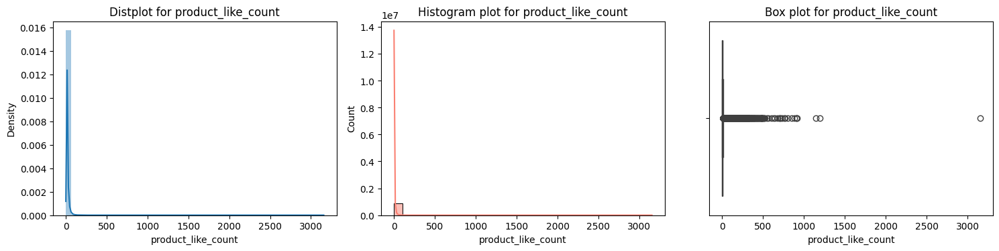

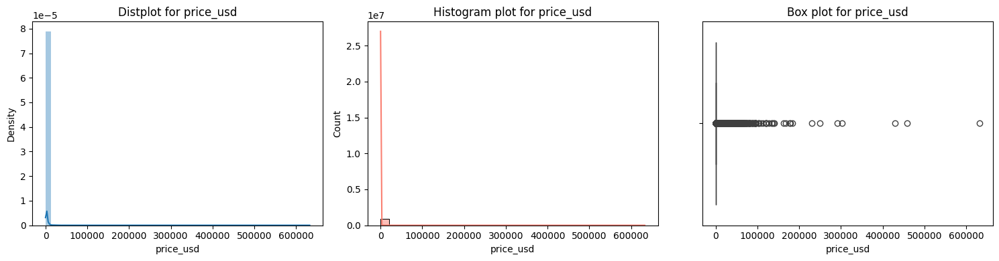

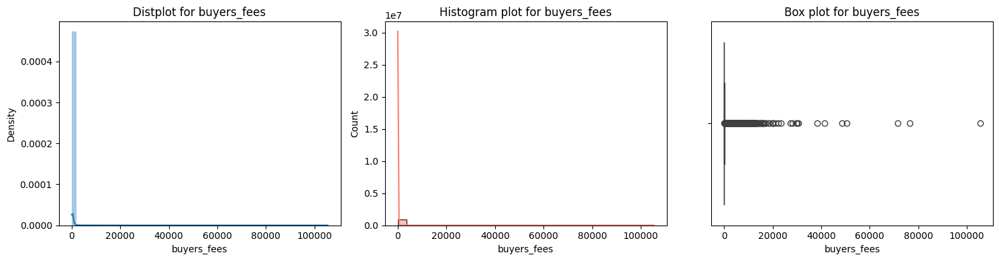

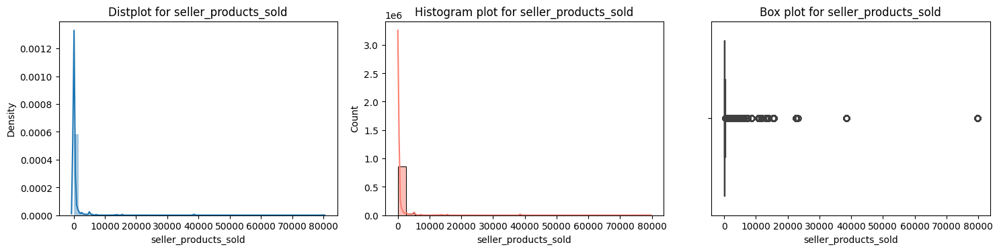

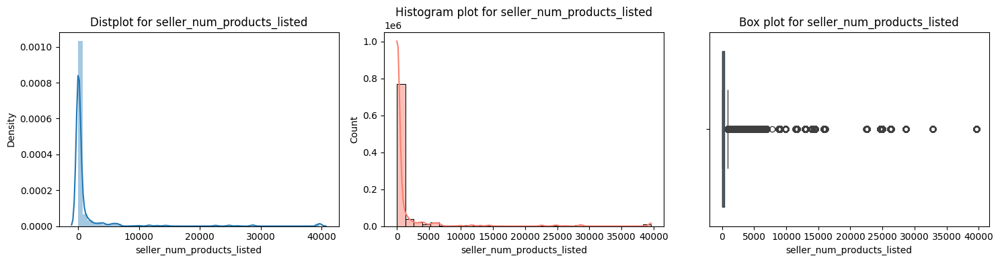

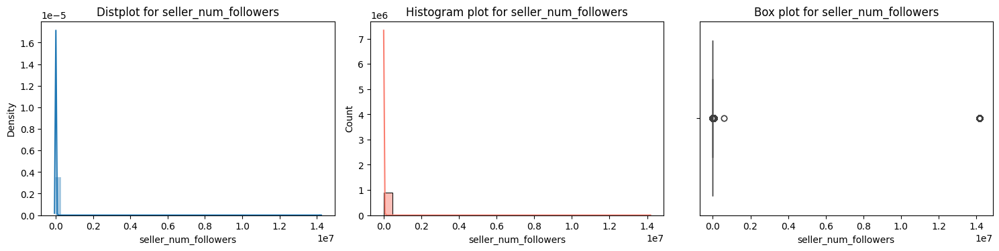

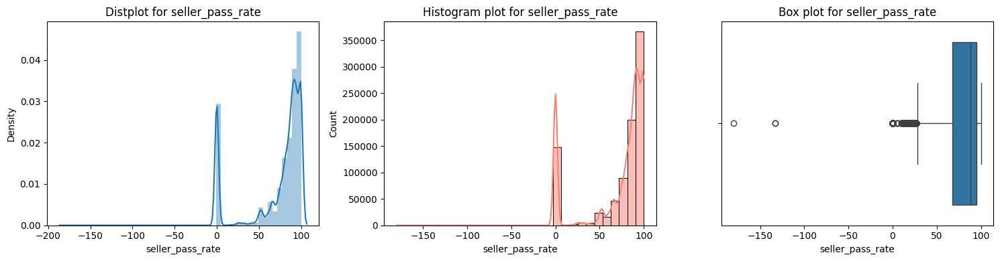

In [208]:
import matplotlib.pyplot as plt
import seaborn as sns

# Your function to plot the distribution, histogram, and boxplot
def plot(df, column):
    plt.figure(figsize=(15, 4))
    
    # Distplot
    plt.subplot(1, 3, 1)
    sns.distplot(df[column])
    plt.title("Distplot for " + column)
    
    # Histogram plot
    plt.subplot(1, 3, 2)
    sns.histplot(df, x=column, kde=True, bins=30, color="salmon")
    plt.title("Histogram plot for " + column)
    
    # Boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(x=df[column])
    plt.title("Box plot for " + column)
    
    plt.tight_layout()
    plt.show()

# Columns to plot (you'll only want to do this for numerical columns)
columns_to_plot = [
    'product_like_count', 'price_usd', 'buyers_fees', 'seller_products_sold', 
    'seller_num_products_listed', 'seller_num_followers', 
    'seller_pass_rate'
]

# Generate plots for each numerical column
for col in columns_to_plot:
    plot(df1, col)


In [209]:
df1["product_like_count"]= np.log(df1['product_like_count'])
df1[ 'price_usd']= np.log(df1[ 'price_usd'])
df1['buyers_fees']= np.log(df1['buyers_fees'])
df1['seller_products_sold']= np.log(df1['seller_products_sold'])
df1['seller_num_products_listed']= np.log(df1['seller_num_products_listed'])
# df1['seller_community_rank']= np.log(df1['seller_community_rank'])
df1['seller_num_followers']= np.log(df1['seller_num_followers'])
df1['seller_pass_rate']= np.log(df1['seller_pass_rate'])


 

In [210]:
# Find rows where the value is zero or negative
problematic_rows = df1[df1['product_like_count'] <0]


In [211]:
problematic_rows 

,product_type,product_gender_target,product_category,product_season,product_condition,product_like_count,sold,reserved,available,in_stock,...,seller_num_followers,seller_pass_rate,product_gender_target_binary,product_category_encoded,product_season_encoded,product_condition_encoded,product_material_encoded,product_color_encoded,seller_badge_encoded,seller_country_encoded
3,Mini skirt,Women,Women Clothing,All seasons,Very good condition,-inf,False,False,True,False,...,4.875197,4.564348,0,4,2,2,39,3,1.0,86
5,Mid-length dress,Women,Women Clothing,All seasons,Very good condition,-inf,False,False,True,False,...,3.044522,4.605170,0,4,2,2,9,24,0.0,19
7,Silk mid-length dress,Women,Women Clothing,All seasons,Very good condition,-inf,False,False,True,False,...,3.761200,4.406719,0,4,2,2,46,3,0.0,32
8,Suit jacket,Women,Women Clothing,All seasons,Very good condition,-inf,False,False,True,False,...,3.526361,4.564348,0,4,2,2,8,1,2.0,35
20,Coat,Women,Women Clothing,All seasons,Very good condition,-inf,False,False,True,False,...,4.875197,4.564348,0,4,2,2,8,4,1.0,86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
900499,Sandal,Women,Women Shoes,Autumn / Winter,Good condition,-inf,False,False,False,False,...,5.662960,4.605170,0,5,0,3,17,16,2.0,76
900500,Leather boots,Women,Women Shoes,All seasons,Fair condition,-inf,False,False,True,False,...,4.682131,4.317488,0,5,2,4,23,3,0.0,35
900504,Leather sandals,Women,Women Shoes,All seasons,Never worn,-inf,False,False,True,False,...,1.609438,4.605170,0,5,2,0,23,4,2.0,77
900506,Leather mules & clogs,Women,Women Shoes,All seasons,Very good condition,-inf,False,False,True,False,...,2.397895,-inf,0,5,2,2,23,3,0.0,19


In [219]:
# Replace negative values with NaN
df1.loc[df1['seller_pass_rate'] < 0, 'seller_pass_rate'] = np.nan

# Impute with the mean or median
df1['seller_pass_rate'].fillna(df1['seller_pass_rate'].median(), inplace=True)



In [220]:
# Replace inf values with NaN to combine both checks
combined_nan_inf_counts = df1.replace([np.inf, -np.inf], np.nan).isna().sum()
print("Combined NaN and infinity counts in each column:")
print(combined_nan_inf_counts)


Combined NaN and infinity counts in each column:
product_type                      0
product_gender_target             0
product_category                  0
product_season                    0
product_condition                 0
product_like_count                0
sold                              0
reserved                          0
available                         0
in_stock                          0
should_be_gone                    0
brand_name                        0
product_material                  0
product_color                     0
price_usd                         0
seller_badge                      0
has_cross_border_fees             0
buyers_fees                       0
seller_country                    0
seller_products_sold              0
seller_num_products_listed        0
seller_community_rank             0
seller_num_followers            664
seller_pass_rate                  0
product_gender_target_binary      0
product_category_encoded          0
product_season_

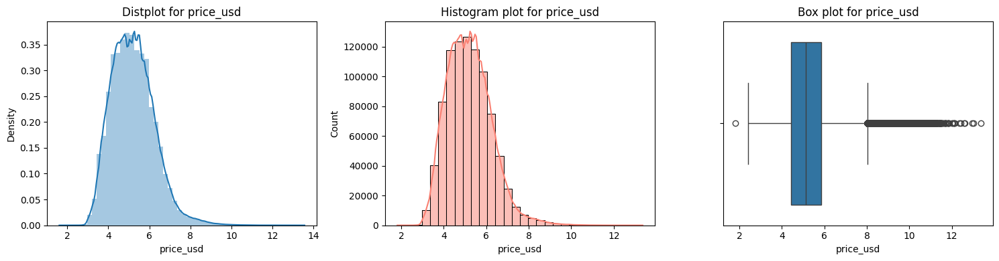

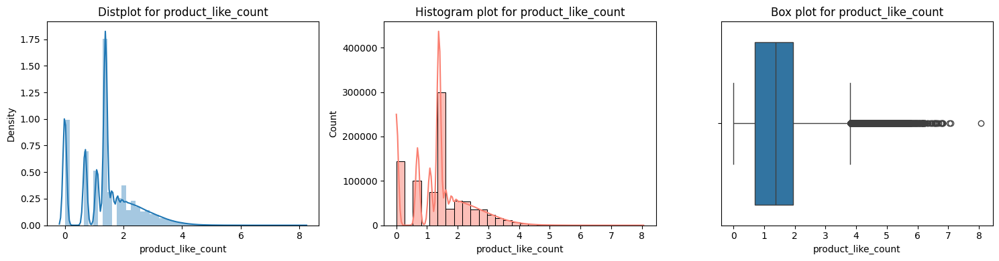

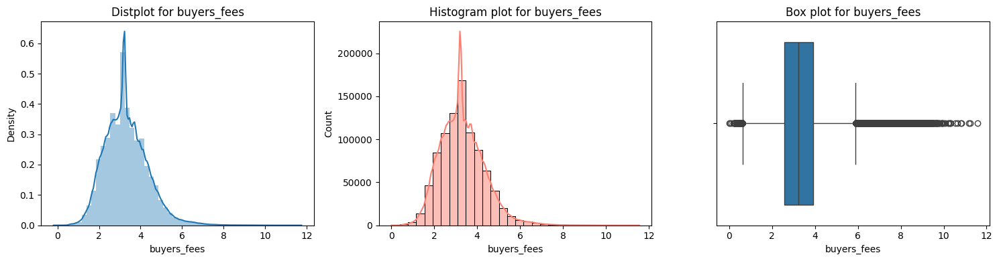

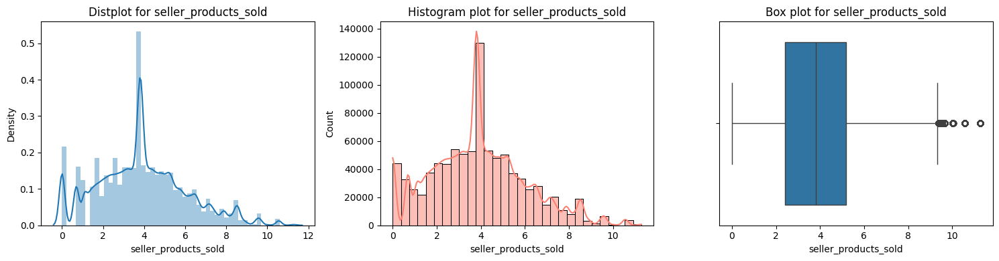

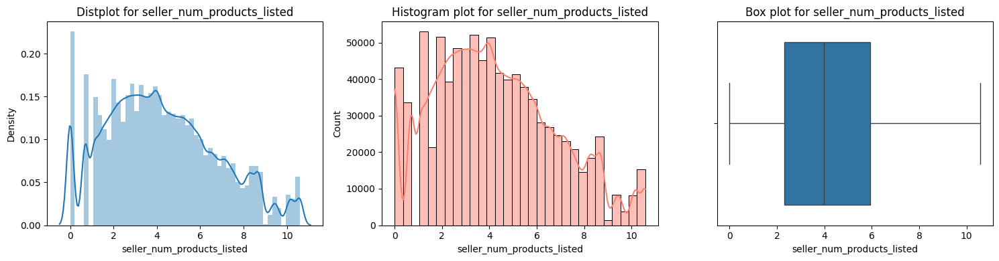

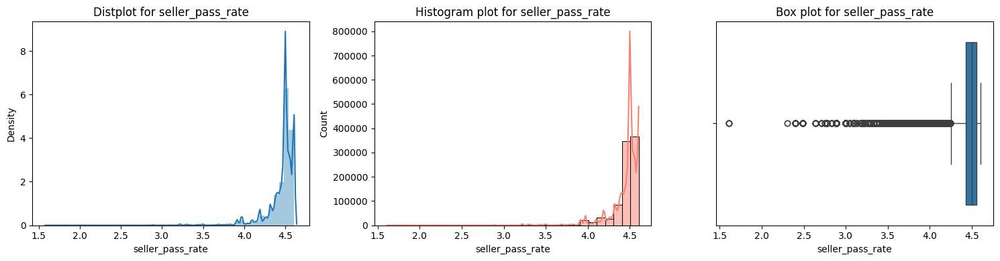

In [221]:
skewed_columns=['price_usd', 'product_like_count', 'buyers_fees', 'seller_products_sold', 
    'seller_num_products_listed','seller_pass_rate'
    ]
for i in skewed_columns:
    plot(df1,i)

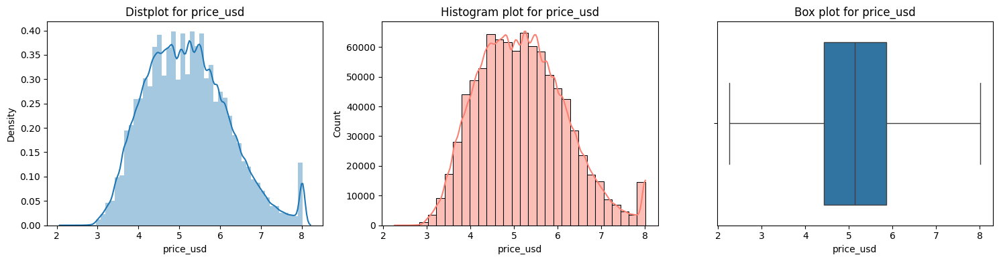

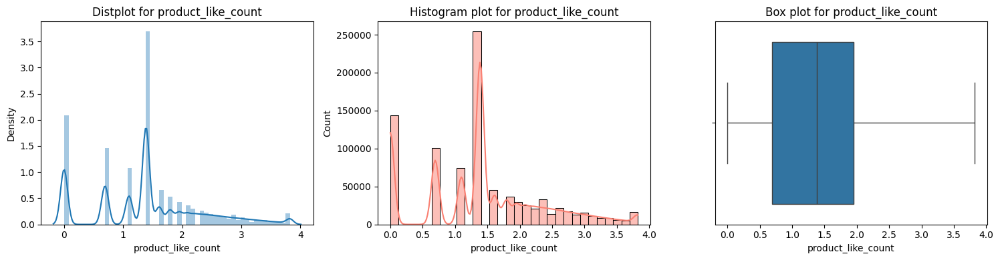

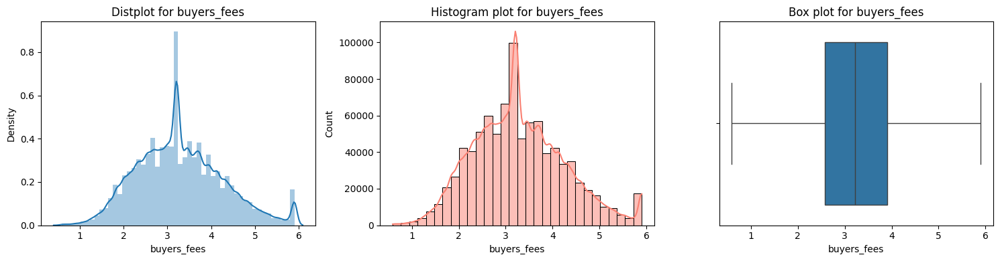

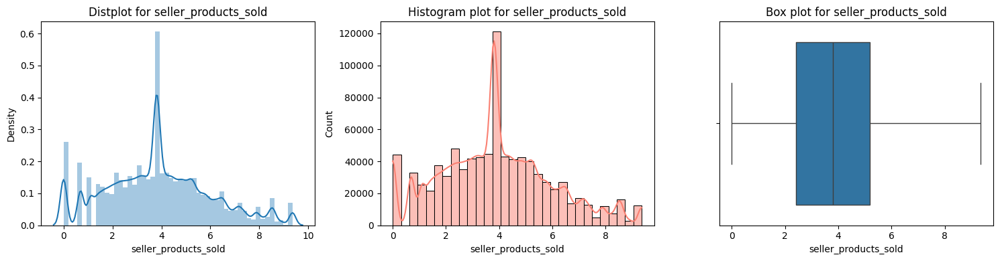

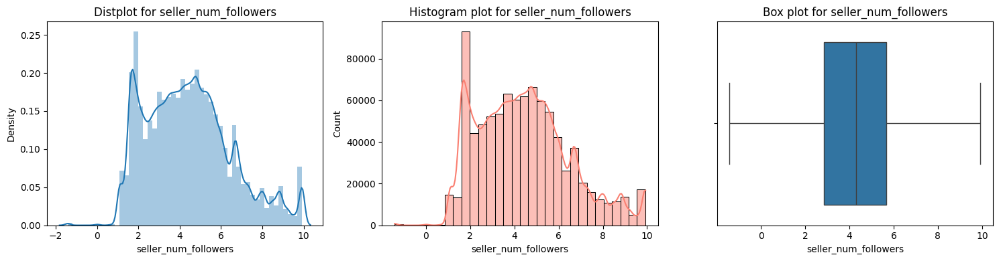

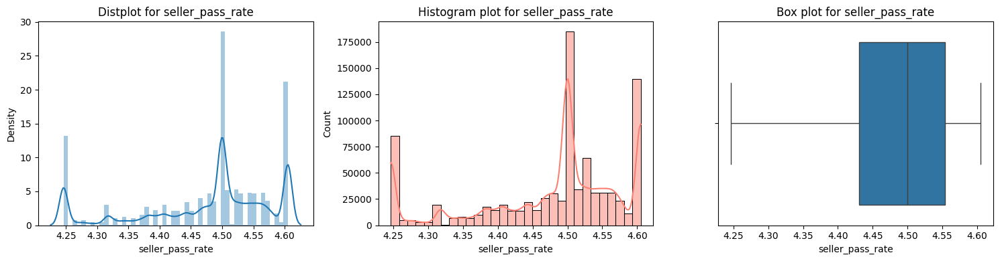

In [222]:
def outlier(df,column):
  q1= df[column].quantile(0.25)
  q3= df[column].quantile(0.75)

  iqr= q3-q1

  upper_threshold= q3 + (1.5*iqr)
  lower_threshold= q1 - (1.5*iqr)

  df[column]= df[column].clip(lower_threshold, upper_threshold)
outlier_columns=['price_usd', 'product_like_count', 'buyers_fees', 'seller_products_sold', 
     'seller_num_followers','seller_pass_rate' ]
for j in outlier_columns:
    outlier(df1,j)
for k in outlier_columns:
    plot(df1,k)

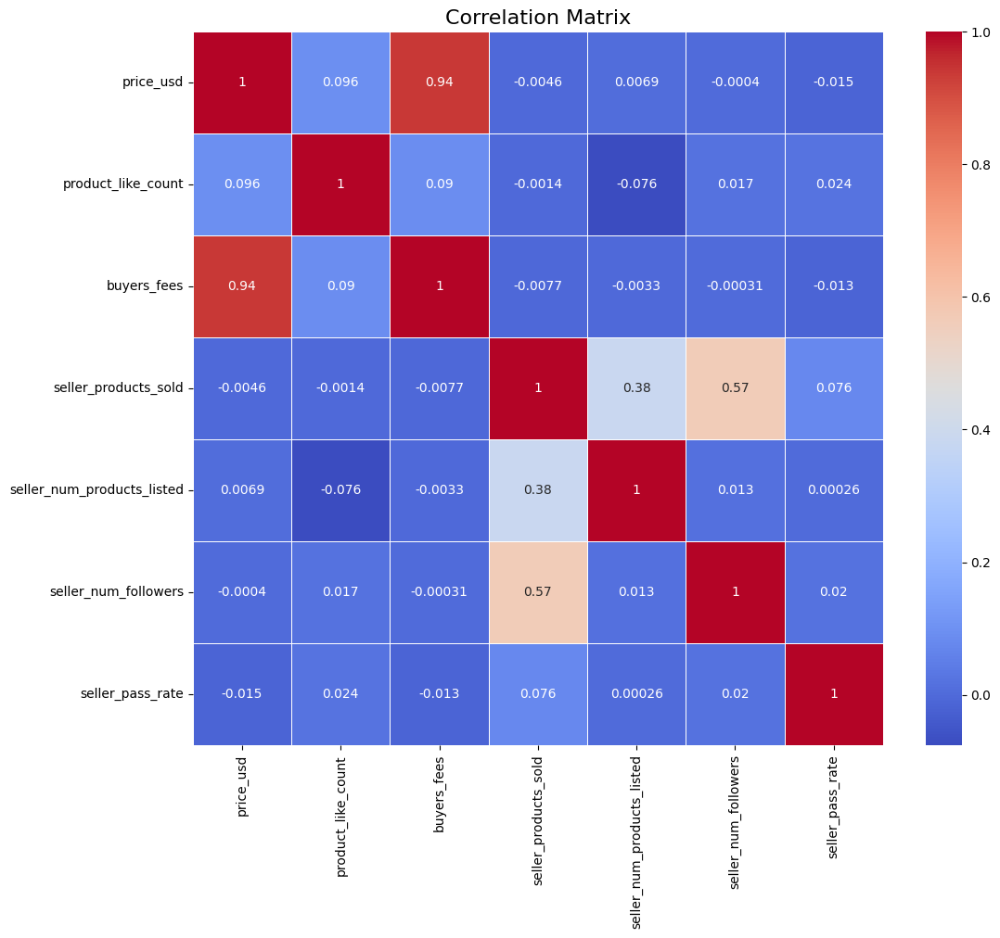

In [223]:
numerical_columns = numerical_columns[['price_usd', 'product_like_count', 'buyers_fees', 'seller_products_sold', 
    'seller_num_products_listed', 'seller_num_followers','seller_pass_rate' ]]
correlation_matrix = numerical_columns.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix', fontsize=16)
plt.show()

In [224]:
df1=df1.drop(['seller_community_rank'],axis=1)

In [225]:
df2= df1.copy()
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
product_like_count,900461.0,1.432261,0.940827,0.000000,0.693147,1.386294,1.945910,3.825055
price_usd,900461.0,5.194850,1.007699,2.262309,4.419684,5.128122,5.857933,8.015307
buyers_fees,900461.0,3.287389,0.980222,0.589897,2.581731,3.214868,3.909620,5.901454
seller_products_sold,900461.0,3.886274,2.122085,0.000000,2.397895,3.806662,5.181784,9.357616
seller_num_products_listed,900461.0,4.242020,2.532540,0.000000,2.302585,3.970292,5.921578,10.587291
seller_num_followers,900461.0,4.434193,2.060276,-1.421788,2.833213,4.290459,5.669881,9.924882
seller_pass_rate,900461.0,4.477454,0.106217,4.246227,4.430817,4.499810,4.553877,4.605170
product_gender_target_binary,900461.0,0.464311,0.498725,0.000000,0.000000,0.000000,1.000000,1.000000
product_category_encoded,900461.0,2.633190,1.645275,0.000000,1.000000,3.000000,4.000000,5.000000
product_season_encoded,900461.0,1.703918,0.679772,0.000000,2.000000,2.000000,2.000000,2.000000


In [226]:

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
import pickle

In [227]:
df2.columns

Index(['product_type', 'product_gender_target', 'product_category',
       'product_season', 'product_condition', 'product_like_count', 'sold',
       'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_name',
       'product_material', 'product_color', 'price_usd', 'seller_badge',
       'has_cross_border_fees', 'buyers_fees', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_num_followers', 'seller_pass_rate',
       'product_gender_target_binary', 'product_category_encoded',
       'product_season_encoded', 'product_condition_encoded',
       'product_material_encoded', 'product_color_encoded',
       'seller_badge_encoded', 'seller_country_encoded'],
      dtype='object')

In [229]:
df3 = df2.drop(['product_type', 'product_gender_target', 'product_category',
                'product_season', 'product_condition', 'sold','seller_badge',
                'reserved', 'available', 'in_stock', 'should_be_gone', 'brand_name',
                'product_material', 'product_color','has_cross_border_fees'], axis=1)


In [230]:
df3.columns

Index(['product_like_count', 'price_usd', 'buyers_fees', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_num_followers', 'seller_pass_rate',
       'product_gender_target_binary', 'product_category_encoded',
       'product_season_encoded', 'product_condition_encoded',
       'product_material_encoded', 'product_color_encoded',
       'seller_badge_encoded', 'seller_country_encoded'],
      dtype='object')

In [ ]:
df3=df3.drop(['seller_country'],axis=1)

In [231]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

def select_model(df, algorithm):
    # Original and encoded categorical columns
    categorical_columns = ['product_type', 'product_gender_target', 'product_category',
                           'product_season', 'product_condition', 'product_material', 
                           'product_color', 'seller_country']
    encoded_columns = [ 'product_gender_target_binary',
                       'product_category_encoded', 'product_season_encoded',
                       'product_condition_encoded', 'product_material_encoded',
                       'product_color_encoded', 'seller_country_encoded']
    
    # x, y splitting
    x = df3.drop(columns=["price_usd"])
    y = df3["price_usd"]

    # Drop original categorical columns and keep encoded ones
    x = x.drop(columns=categorical_columns, errors='ignore')
    
    # Optionally, you can ensure only encoded columns are included
    # Uncomment the line below if you want to enforce that only encoded columns are present
    # x = x[[col for col in x.columns if col in encoded_columns]]

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    
    # Display columns in X_train
    print("Columns in X_train:", X_train.columns.tolist())
    
    # Fit the model
    model = algorithm().fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    
    # Check performance metrics
    train_mse = mean_squared_error(y_train, y_pred_train)
    train_rmse = np.sqrt(train_mse)
    train_mae = mean_absolute_error(y_train, y_pred_train)
    train_r2 = r2_score(y_train, y_pred_train)

    test_mse = mean_squared_error(y_test, y_pred_test)
    test_rmse = np.sqrt(test_mse)
    test_mae = mean_absolute_error(y_test, y_pred_test)
    test_r2 = r2_score(y_test, y_pred_test)

    metrics_train = {
        "Data": "Train Data",
        "Name": algorithm.__name__,
        "R2_score": train_r2,
        "Mean_squared_error": train_mse,
        "Root_mean_squared_error": train_rmse,
        "Mean_absolute_error": train_mae
    }

    metrics_test = {
        "Data": "Test Data",
        "Name": algorithm.__name__,
        "R2_score": test_r2,
        "Mean_squared_error": test_mse,
        "Root_mean_squared_error": test_rmse,
        "Mean_absolute_error": test_mae
    }

    print(metrics_train)
    print(metrics_test)
    print("")

# Example usage:
# from sklearn.linear_model import LinearRegression
# select_model(df, LinearRegression)


In [232]:
df3.columns

Index(['product_like_count', 'price_usd', 'buyers_fees', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_num_followers', 'seller_pass_rate',
       'product_gender_target_binary', 'product_category_encoded',
       'product_season_encoded', 'product_condition_encoded',
       'product_material_encoded', 'product_color_encoded',
       'seller_badge_encoded', 'seller_country_encoded'],
      dtype='object')

In [246]:
import pandas as pd

# Example DataFrame


# Step 1: Get the frequency of each category
category_counts = df['product_type'].value_counts()

# Step 2: Replace categories with their frequency counts
df['product_type_encoded'] = df['product_type'].map(category_counts)

# Step 3: Group product types by their frequency counts
grouped_by_frequency = df.groupby('product_type_encoded')['product_type'].apply(lambda x: list(x.unique())).reset_index()

# Print the grouped values as a list
print("Product types grouped by frequency counts:")
print(grouped_by_frequency)

# Save to Excel
grouped_by_frequency.to_excel('product_types_grouped_by_frequency.xlsx', index=False)


Product types grouped by frequency counts:
     product_type_encoded                                       product_type
0                       1  [Spring Summer 2021 lace mini dress, Fall Wint...
1                       2  [Spring Summer 2021 leggings, Vinyl leggings, ...
2                       3  [725 bootcut jeans, J'Adior t-shirt, Max Mara ...
3                       4  [Raccoon biker jacket, Spring Summer 2020 silk...
4                       5  [Polo ajusté manches courtes polo, Spring Summ...
..                    ...                                                ...
462                 21958                                            [Shirt]
463                 24929                                          [T-shirt]
464                 26103                                         [Silk tie]
465                 29499                                           [Jacket]
466                 42861                                       [Sunglasses]

[467 rows x 2 columns]


In [242]:
df['product_type_encoded'].unique()

array([  624, 29499,  7233,  2805,    54, 14637,   380,  3472,   633,
         447,  1521,  3809,  3770,  1453, 16768,  5534,  3620,   132,
       21958,  2157,  6301,  5666,  1008,    76,   352,  2341,  6272,
         312,   914,  7708,    94,   515, 24929, 10067, 13807,   831,
        2710,   200,  1353,  3231,   230,    33,    12,  2327,  3658,
        5591,  1173,  1196,  1912,   719,    83,  1320,  1691,   341,
          80,   183,     5,   596,    36,   903,    53,  2475,    42,
       18482,   679,  2488,  1434,  1088,    45,   378,  1884,   832,
         275,  1007,    18,   506,   133,    39,   559,    68,    95,
         459,   407,   337,   255,  1615,   145,   486,   941,  1900,
         319,    30,   456,   566,     2,    78,    77,     3,  1512,
         357,   339,   800,   131,   895,   104,    70,     1,   477,
          62,   511,    15,    37,  2569,    96,   587,   107,  3202,
         452,   242,  1654,   431,   126,    13,   478,    74,   386,
           4,   179,

In [396]:
select_model(df3, AdaBoostRegressor)
select_model(df3, ExtraTreesRegressor)
select_model(df3, GradientBoostingRegressor)
select_model(df3, XGBRegressor)

Columns in X_train: ['product_like_count', 'buyers_fees', 'seller_products_sold', 'seller_num_products_listed', 'seller_num_followers', 'seller_pass_rate', 'product_type_encoded', 'brand_name_encoded', 'product_gender_target_binary', 'product_category_encoded', 'product_season_encoded', 'product_condition_encoded', 'product_material_encoded', 'product_color_encoded', 'seller_country_encoded']
{'Data': 'Train Data', 'Name': 'AdaBoostRegressor', 'R2_score': 0.8368945788485356, 'Mean_squared_error': 0.16563377724711317, 'Root_mean_squared_error': 0.40698129839970926, 'Mean_absolute_error': 0.30687801446344387}
{'Data': 'Test Data', 'Name': 'AdaBoostRegressor', 'R2_score': 0.8357353154189575, 'Mean_squared_error': 0.16677407291848953, 'Root_mean_squared_error': 0.4083798145335902, 'Mean_absolute_error': 0.30789045137454985}

Columns in X_train: ['product_like_count', 'buyers_fees', 'seller_products_sold', 'seller_num_products_listed', 'seller_num_followers', 'seller_pass_rate', 'product_ty

In [397]:
df3.columns

Index(['product_like_count', 'price_usd', 'buyers_fees',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_num_followers', 'seller_pass_rate', 'product_type_encoded',
       'brand_name_encoded', 'product_gender_target_binary',
       'product_category_encoded', 'product_season_encoded',
       'product_condition_encoded', 'product_material_encoded',
       'product_color_encoded', 'seller_country_encoded'],
      dtype='object')

In [404]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
import numpy as np

def select_model(df, algorithm):
    # Original and encoded categorical columns
    categorical_columns = ['product_type', 'product_gender_target', 'product_category',
                           'product_season', 'product_condition', 'product_material', 
                           'product_color', 'seller_country']
    
    # x, y splitting
    x = df.drop(columns=["price_usd"])  # Adjust the target column name if necessary
    y = df["price_usd"]

    # Drop original categorical columns and keep encoded ones
    x = x.drop(columns=categorical_columns, errors='ignore')
    
    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    
    # Fit the model
    model_1 = algorithm().fit(X_train, y_train)
    
    # Evaluate the model on train and test data
    y_pred_train = model_1.predict(X_train)
    y_pred_test = model_1.predict(X_test)
    
    # Calculate performance metrics
    train_mse = mean_squared_error(y_train, y_pred_train)
    train_rmse = np.sqrt(train_mse)
    train_mae = mean_absolute_error(y_train, y_pred_train)
    train_r2 = r2_score(y_train, y_pred_train)

    test_mse = mean_squared_error(y_test, y_pred_test)
    test_rmse = np.sqrt(test_mse)
    test_mae = mean_absolute_error(y_test, y_pred_test)
    test_r2 = r2_score(y_test, y_pred_test)

    # Print metrics
    print({"Data": "Train Data", "R2_score": train_r2, "RMSE": train_rmse, "MAE": train_mae})
    print({"Data": "Test Data", "R2_score": test_r2, "RMSE": test_rmse, "MAE": test_mae})
    
    # Return the trained model
    return model_1

# Train the model and store it
model_1 = select_model(df3, RandomForestRegressor)

# Now you can use model_1 to make predictions with user data



{'Data': 'Train Data', 'R2_score': 0.9975307375568641, 'RMSE': 0.05007533697242437, 'MAE': 0.009940843487315923}
{'Data': 'Test Data', 'R2_score': 0.9843297027494076, 'RMSE': 0.1261335975861529, 'MAE': 0.02542776721457273}


In [405]:
df3.iloc[56788]

product_like_count                  0.693147
price_usd                           5.766757
buyers_fees                         3.974998
seller_products_sold                5.690359
seller_num_products_listed          5.583496
seller_num_followers                5.003946
seller_pass_rate                    4.394449
product_type_encoded             3809.000000
brand_name_encoded              10460.000000
product_gender_target_binary        0.000000
product_category_encoded            4.000000
product_season_encoded              2.000000
product_condition_encoded           2.000000
product_material_encoded           38.000000
product_color_encoded              16.000000
seller_country_encoded             35.000000
Name: 56788, dtype: float64

In [134]:
log_min_value = df3['seller_pass_rate'].min()
log_max_value = df3['seller_pass_rate'].max()

# Step 2: Apply the exponential function to get the original values
original_min_value = np.exp(log_min_value)
original_max_value = np.exp(log_max_value)

print(f"Original Min Value: {original_min_value}")
print(f"Original Max Value: {original_max_value}")

Original Min Value: 69.8413792262392
Original Max Value: 100.00000000000004


In [97]:
df4=df3.copy()

In [135]:
df3.columns

Index(['product_like_count', 'price_usd', 'buyers_fees', 'seller_country',
       'seller_products_sold', 'seller_num_products_listed',
       'seller_num_followers', 'seller_pass_rate', 'product_type_encoded',
       'brand_name_encoded', 'product_gender_target_binary',
       'product_category_encoded', 'product_season_encoded',
       'product_condition_encoded', 'product_material_encoded',
       'product_color_encoded', 'seller_country_encoded'],
      dtype='object')

In [147]:
# Ensure both columns are present
if 'product_type' in df.columns:
    # Create a mapping between encoded and original values
    encoded_to_original_mapping = df['product_type'].drop_duplicates()

    # Display the unique encoded values along with their original counterparts
    print(encoded_to_original_mapping)
else:
    print("Either 'product_type' or 'product_type_encoded' column is missing in the DataFrame.")


0                    Wool mini skirt
1                             Jacket
2                          Wool coat
3                         Mini skirt
4             Vegan leather trousers
                     ...            
900006    Susanna cloth cowboy boots
900041    Drops leather riding boots
900048          Velvet western boots
900051    Marmont cloth cowboy boots
900470             Kitty cloth heels
Name: product_type, Length: 10984, dtype: object


In [406]:
user_data = np.array([[0.693147, 3.974998, 5.690359, 5.583496, 5.003946, 4.394449, 3809.0, 10460.0, 
                       0.0, 4.0, 2.0, 2.0, 38.0, 16.0, 35.0]])
user_data = user_data.reshape(1, -1)
y_pred_1 = model_1.predict(user_data)

print("Predicted Price:", y_pred_1[0])

Predicted Price: 5.766757273817606


In [407]:
# Saving the Model unsing pickle
with open("PRE_OWNED_LUXURY.pkl","wb") as f:
  pickle.dump(model_1,f)
import pickle
import numpy as np
with open("PRE_OWNED_LUXURY.pkl","rb") as f1:
    regg_model= pickle.load(f1)
user_data = np.array([[0.693147, 3.974998, 5.690359, 5.583496, 5.003946, 4.394449, 3809.0, 10460.0, 
                       0.0, 4.0, 2.0, 2.0, 38.0, 16.0, 35.0]])
user_data = user_data.reshape(1, -1)
y_pred_1 = model_1.predict(user_data)

print("Predicted Price:", y_pred_1[0])

Predicted Price: 5.766757273817606


In [148]:
df3

,product_like_count,price_usd,buyers_fees,seller_country,seller_products_sold,seller_num_products_listed,seller_num_followers,seller_pass_rate,product_type_encoded,brand_name_encoded,product_gender_target_binary,product_category_encoded,product_season_encoded,product_condition_encoded,product_material_encoded,product_color_encoded,seller_country_encoded
0,3.526361,5.609179,3.176803,Germany,1.098612,2.639057,2.564949,4.499810,624,4413,0,4,0,0,67,13,22
1,0.000000,4.850467,3.058707,Belgium,3.806662,3.970292,2.079442,4.499810,29499,287,0,4,2,2,8,17,8
2,0.693147,7.153052,5.361292,Spain,4.060443,4.234107,4.127134,4.564348,7233,3456,0,4,0,2,67,24,74
3,1.386294,5.099256,2.701361,United States,4.143135,5.613128,4.875197,4.564348,2805,566,0,4,2,2,39,3,86
4,0.000000,4.785156,2.993229,United Kingdom,2.944439,2.639057,3.688879,4.488636,54,8,0,4,2,2,59,3,85
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
900509,0.000000,4.493792,2.702032,Italy,3.688879,2.833213,4.644391,4.605170,255,1932,0,5,2,3,19,11,35
900510,0.000000,5.032788,3.241029,Austria,3.258097,4.595120,4.317488,4.488636,17436,959,0,5,2,3,23,3,4
900511,1.386294,5.255932,3.464172,France,3.806662,0.693147,1.098612,4.499810,726,483,0,5,2,2,23,3,19
900512,3.295837,4.051959,2.260721,Italy,0.693147,1.945910,2.397895,4.605170,2406,1258,0,5,2,2,23,3,35


In [146]:
df1['price_usd'].max()

632610.0